In [1]:
import numpy as np
import matplotlib.pyplot as plt
from svg.path import parse_path
from svg.path.path import Line
from xml.dom import minidom

## Parsing SVG file into path.
Constructing a dictionary of pointing points p1->p2.

In [2]:
def get_paths(filename):
    # read the SVG file
    doc = minidom.parse(filename)
    path_strings = [path.getAttribute('d') for path
                    in doc.getElementsByTagName('path')]
    doc.unlink()

    path_out = {}
    for path_string in path_strings:
        path = parse_path(path_string)       

        for e in path:
                x0 = e.start.real
                y0 = e.start.imag
                x1 = e.end.real
                y1 = e.end.imag
                if x0 != x1 or y0!=y1:
                    path_out[(x0,y0)] = (x1,y1)
    return path_out

Setting constants and building the graph flow as a single line.

In [3]:
n_circles = 100 #Setting the number of circles to approximate, the more the marrier.
delta_t = 0.001 #etting delta_t for numerical integration.
paths_dict = get_paths('pi.svg') # parsing the svg

inp = np.arange(0,1,delta_t) # creating input of time. out function will be f(time)-> x+iy 

next_pos = list(paths_dict.keys())[0] # setting starting position.
path_flow = [] # flow of the line
visited = set() # visited points.
while next_pos not in visited:
    visited.add(next_pos) 
    nextnext = paths_dict[next_pos] # get next poisiton
    path_flow.append((next_pos, nextnext)) # add it to list
    next_pos = nextnext   


### visualize the expected path

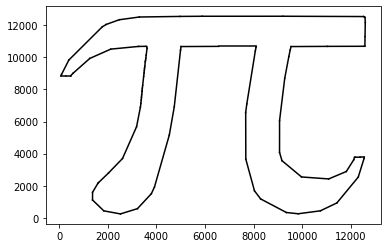

In [4]:
for path in  path_flow:
    (x0,y0) ,(x1,y1) = path
    plt.plot([x0,x1],[y0,y1],c='k')
    

## Our function
t is time s.t $0\leq t \leq 1$, and our function is a list of adjecent lines.
Thus, to compute $f(t)$ we need to multiply $t\times n_lines$ to find the requested line. Next using the ratio of t (expresed by how much t i far from its path's index) we can express the number as a complex number as describe below.

## Fourier coefficient
$$
c_n =\int_{0}^{1} f(t)e^{-n\cdot 2\pi i \cdot t} \,dt
$$

In [13]:
def func(t):
    ind = int((t*len(path_flow))) # find relevant path index
    (x0,y0),  (x1,y1) = path_flow[ind] # extract line
    ratio = t*len(path_flow) - ind # find raio on the line
    
    real =  ratio * x1 + (1-ratio) * x0 # express the wighted avarage
    imag =  ratio * y1 + (1-ratio) * y0
    
    return real +1j*imag
    
    

def coeff(n):
    return sum(func(t)*np.exp(-n*2*np.pi*1j*t)*delta_t for t in inp) # numerical integration of the coefficient
coeffs = {n: coeff(n) for n in range(-n_circles,n_circles+1)} # pre calculate the coefficients

In [6]:
def plot_complex(cs,**kwargs):
    real = [x.real for x in cs]
    imag = [x.imag for x in cs]
    plt.plot(real,imag,**kwargs)

## The fourier series
$$
f(t) = \sum  c_{n}e^{n\cdot 2\pi i t}
$$

In [7]:
def func_fourier(t):
    return sum(coeffs[n]*np.exp(n*2*np.pi*1j*t) for n in range(-n_circles,n_circles+1))

In [8]:
output = [func_fourier(t) for t in inp]

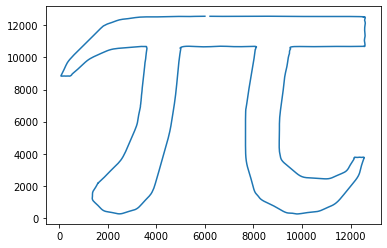

In [9]:
plot_complex(output)

### animation

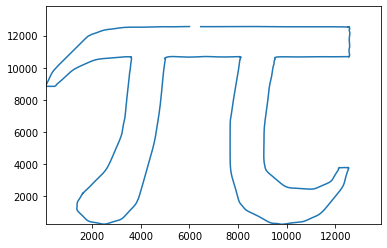

In [14]:
import matplotlib.animation

real = [x.real for x in output]
imag = [x.imag for x in output]

fig, ax = plt.subplots()
ax.axis([min(real)*1.1,max(real)*1.1,min(imag)*1.1,max(imag)*1.1])
l, = ax.plot([],[])

def animate(i):
    l.set_data(real[:i], imag[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(real))

from IPython.display import HTML
HTML(ani.to_jshtml())